# inference only

## Подготовка и тесты

### Detection

In [3]:
#cpu only
!pip install torch==1.9.0+cpu torchvision==0.10.0+cpu -f https://download.pytorch.org/whl/torch_stable.html

# ссылку на версию брать тут https://mmcv.readthedocs.io/en/latest/get_started/installation.html
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cpu/torch1.9.0/index.html


# либа для винды какая=то дополнительная	
!pip install pycocotools-windows

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .

%cd ..

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     -------------------------------------- 222.1/222.1 MB 2.1 MB/s eta 0:00:00
     -------------------------------------- 914.0/914.0 kB 2.5 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cpu/torch1.9.0/index.html


'rm' is not recognized as an internal or external command,
operable program or batch file.


e:\develop\mikiz\repos\key_seg_project\mmdetection


fatal: destination path 'mmdetection' already exists and is not an empty directory.


Obtaining file:///E:/develop/mikiz/repos/key_seg_project/mmdetection
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached matplotlib-3.6.2-cp38-cp38-win_amd64.whl (7.2 MB)
  Using cached pycocotools-2.0.6.tar.gz (24 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached scipy-1.9.3-cp38-cp38-win_amd64.whl (39.8 MB)
  Using cached terminaltables-3.1.10-py2.py3-none-any.whl (15 kB)
  Using cached cycler-0.11.0-py3-none-any.whl (6.4 kB)
  Using cached contourpy-1.0.6-cp38-cp38-win_amd64.whl (163 kB)
  Using cached fonttools-4.38.0-py3-none-any.whl (965 kB)
  Using cached kiwisolver-1.4.4-cp38-cp38-win_amd64.whl (55 kB)
Failed to build py

  error: subprocess-exited-with-error
  
  × Building wheel for pycocotools (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [23 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build
      creating build\lib.win-amd64-cpython-38
      creating build\lib.win-amd64-cpython-38\pycocotools
      copying pycocotools\coco.py -> build\lib.win-amd64-cpython-38\pycocotools
      copying pycocotools\cocoeval.py -> build\lib.win-amd64-cpython-38\pycocotools
      copying pycocotools\mask.py -> build\lib.win-amd64-cpython-38\pycocotools
      copying pycocotools\__init__.py -> build\lib.win-amd64-cpython-38\pycocotools
      running build_ext
      cythoning pycocotools/_mask.pyx to pycocotools\_mask.c
      C:\Users\tayfen\AppData\Local\Temp\pip-build-env-dnqg6yqj\overlay\Lib\site-packages\Cython\Compiler\Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later re

In [1]:
from os import environ
import sys
environ['MMDETECTION_DIR'] = './mmdetection'
environ['DETECTION_MODEL_PATH'] = './models/model_detection_1_12_2022.pth'

# одна и та же либа два раза грузится - просто в конде и где-то в ммдетекшне
environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
sys.path.append(environ['MMDETECTION_DIR'])

from proc_detection import key_detection

detectron = key_detection()

e:\ProgramData\Miniconda3\envs\openmmlab\lib\site-packages\mmcv\__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


load checkpoint from local path: ./models/model_detection_1_12_2022.pth


In [2]:
from glob import glob
test_photos_dir = './test_photos'
all_photos = glob(test_photos_dir + '/*', recursive = True)

[array([[1.2101327e+03, 1.1672488e+03, 1.8822134e+03, 2.8036355e+03,
        1.0000000e+00],
       [2.4025715e+01, 1.3541892e+01, 1.3046114e+02, 3.5122162e+02,
        6.0607228e-02]], dtype=float32)]
[array([[1.2101327e+03, 1.1672488e+03, 1.8822134e+03, 2.8036355e+03,
        1.0000000e+00]], dtype=float32)]


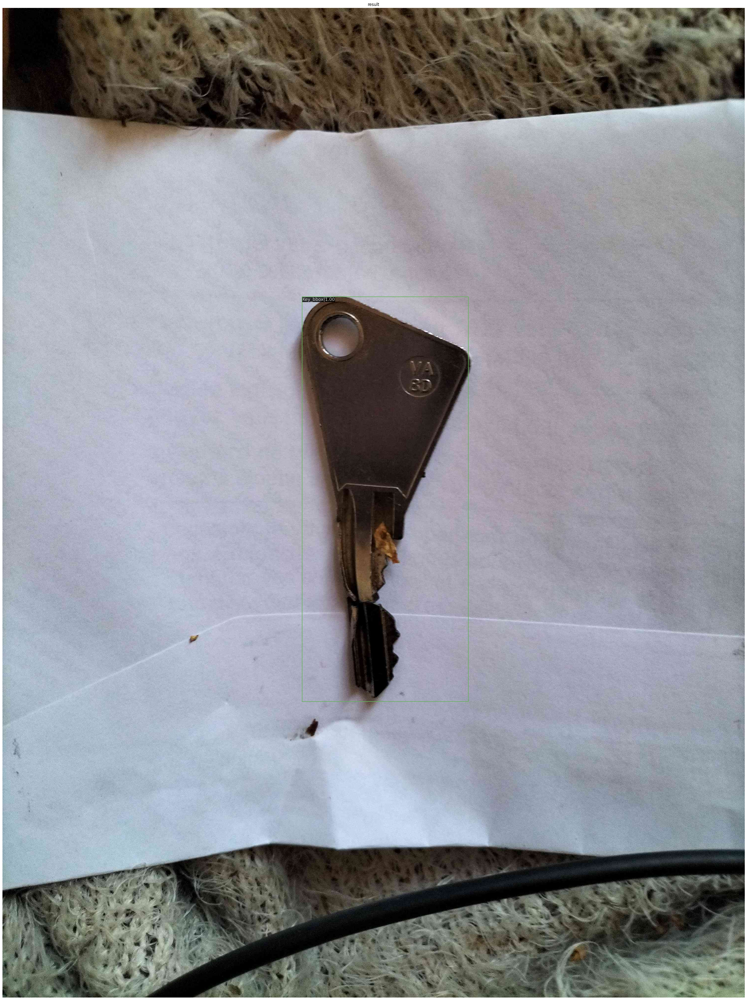

In [67]:
import mmcv
import random
from mmdet.apis import show_result_pyplot, inference_detector

#DEFAULT_IMG_SIZE_FOR_DETECTION = 400
# для обработки можно скалировать и еще меньше, просто чтобы быстрее было
#img = detectron.scale_img(mmcv.imread(random.choice(all_photos)), DEFAULT_IMG_SIZE_FOR_DETECTION)
#img = detectron.scale_img(mmcv.imread(sorted(all_photos)[191]), DEFAULT_IMG_SIZE_FOR_DETECTION)

# внутри детектора уже есть скалирование, детекция происходит на картинке 400
#img = mmcv.imread(sorted(all_photos)[191])
img = mmcv.imread(random.choice(all_photos))
cropped_img = detectron.proc_img(img) # вот эти обрезанные изображения и использовались для построения датасета для сегментации
show_result_pyplot(detectron.model, img, detectron.scaled_result)

### Crop from detected area

In [63]:
cropped_img.shape

(2033, 848, 3)

(-0.5, 872.5, 2125.5, -0.5)

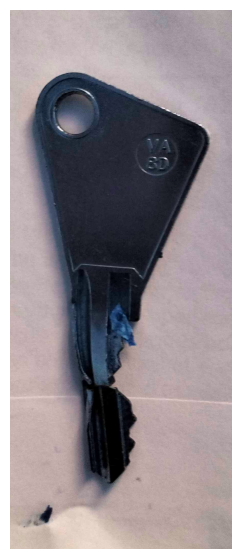

In [68]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,7))
plt.imshow(cropped_img)
plt.axis('off')

### Segmentation

In [18]:
from proc_segmentation import UNet
import torch

device = torch.device('cpu')
model = UNet()
model.load_state_dict(torch.load('./models/512_3unet_50ep_3_12_2022.pth', map_location=torch.device('cpu')))
unet_model = model.to(device)

In [45]:
import cv2
from torchvision.utils import save_image
import torchvision.transforms as tt
import torchvision.transforms.functional as TF
import PIL
import numpy as np

RESCALE_SIZE = 512

class SquarePad:
	def __call__(self, image):
		w, h = image.size
		max_wh = np.max([w, h])
		hp = int((max_wh - w) / 2)
		vp = int((max_wh - h) / 2)
		padding = (hp, vp, hp, vp)
		return TF.pad(image, padding, 0, 'constant')

def segment(image):
    needed_transform = tt.Compose([
            SquarePad(),
            tt.ToTensor(),            
            tt.Resize([RESCALE_SIZE, RESCALE_SIZE]),                    
        ])
    
    image = needed_transform(image)
    image = image.to(device)
    image = torch.unsqueeze(image, dim=0)
    res = unet_model(image).squeeze()
    res = res.detach().cpu()
    image = image.detach().squeeze().cpu().numpy()
    image = np.moveaxis(image, 0, 2)
    res[res<0.5]=0
    res[res>=0.5]=1

    alpha = 1 
    beta = 0.7 # transparency for the segmentation map
    gamma = 0 # scalar added to each sum
    colored_mask = np.zeros_like(image).astype(np.uint8)
    color = [50, 170,  170]
    colored_mask[res == 1] = color
    image = np.array(255*image).astype(np.uint8)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    to_show = cv2.addWeighted(image, alpha, colored_mask, beta, gamma, image)

    return to_show, res

In [69]:
mask_on_image, mask = segment(PIL.Image.fromarray(cropped_img))

(-0.5, 511.5, 511.5, -0.5)

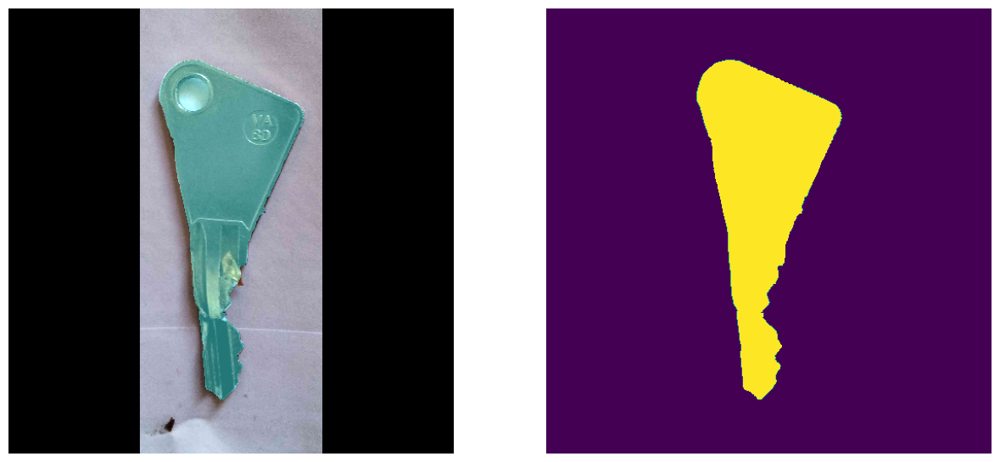

In [70]:
plt.figure(figsize=(15,15))

plt.subplot(2, 2, 1)
plt.imshow(mask_on_image)
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(mask)
plt.axis('off')

## Все в одном